In [2]:
!pip install -qq super-gradients==3.1.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 41.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 73.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 67.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 50.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 9.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to bui

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import os
import requests
import torch
from PIL import Image

from super_gradients.training import Trainer,dataloaders,models
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val
)

from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback
)

[2024-02-09 08:13:27] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-02-09 08:13:27] INFO - utils.py - NumExpr defaulting to 2 threads.
/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2024-02-09 08:13:35] WARNING - __init__.py - Failed to import pytorch_quantization
[2024-02-09 08:13:35] WARNING - calibrator.py - Failed to import pytorch_quantization
[2024-02-09 08:13:35] WARNING - export.py - Failed to import pytorch_quantization
[2024-02-09 08:13:35] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2024-02-09 08:13:35] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2024-02-09 08:13:35] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2024-02-09 08:13:35] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2024-02-09 08:13:35] WARNING

In [ ]:
class config:
    #trainer params
    CHECKPOINT_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train'
    EXPERIMENT_NAME = 'yolonas_exp' #specify the experiment name

    #dataset params
    DATA_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch' #parent directory to where data lives

    TRAIN_IMAGES_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/train/images' #child dir of DATA_DIR where train images are
    TRAIN_LABELS_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/train/labels' #child dir of DATA_DIR where train labels are

    VAL_IMAGES_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/valid/images' #child dir of DATA_DIR where validation images are
    VAL_LABELS_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/valid/labels' #child dir of DATA_DIR where validation labels are

    # if you have a test set
    TEST_IMAGES_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/test/images' #child dir of DATA_DIR where test images are
    TEST_LABELS_DIR = '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/test/labels' #child dir of DATA_DIR where test labels are

    CLASSES = ['weed'] #what class names do you have

    NUM_CLASSES = 1

    #dataloader params - you can add whatever PyTorch dataloader params you have
    #could be different across train, val, and test
    DATALOADER_PARAMS={
    'batch_size':16,
    'num_workers':2
    }

    # model params
    MODEL_NAME = 'yolo_nas_s' # choose from yolo_nas_s, yolo_nas_m, yolo_nas_l
    PRETRAINED_WEIGHTS = 'coco' #only one option here: coco

In [ ]:
trainer = Trainer(experiment_name=config.EXPERIMENT_NAME, ckpt_root_dir=config.CHECKPOINT_DIR)

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TRAIN_IMAGES_DIR,
        'labels_dir': config.TRAIN_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.VAL_IMAGES_DIR,
        'labels_dir': config.VAL_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)



[2024-02-05 06:36:23] WARNING - yolo_format_detection.py - 240 label files are not associated to any image.
Caching annotations:  97%|█████████▋| 34/35 [00:19<00:00,  1.81it/s]

In [ ]:
train_data.dataset.plot()

In [ ]:
model = models.get(config.MODEL_NAME,
                   num_classes=config.NUM_CLASSES,
                   pretrained_weights=config.PRETRAINED_WEIGHTS
                   )

[2024-02-05 07:12:59] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.


In [ ]:
#primary metric (mAP@0.50:0.95 IoU) to be monitored
#hyperparameters in training

train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=config.NUM_CLASSES,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=config.NUM_CLASSES,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

In [ ]:
best_model = models.get(config.MODEL_NAME,
                        num_classes=config.NUM_CLASSES,
                        checkpoint_path=os.path.join(config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'average_model.pth'))

[2024-02-05 07:13:11] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_exp/average_model.pth EMA checkpoint.


[2024-02-05 07:13:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


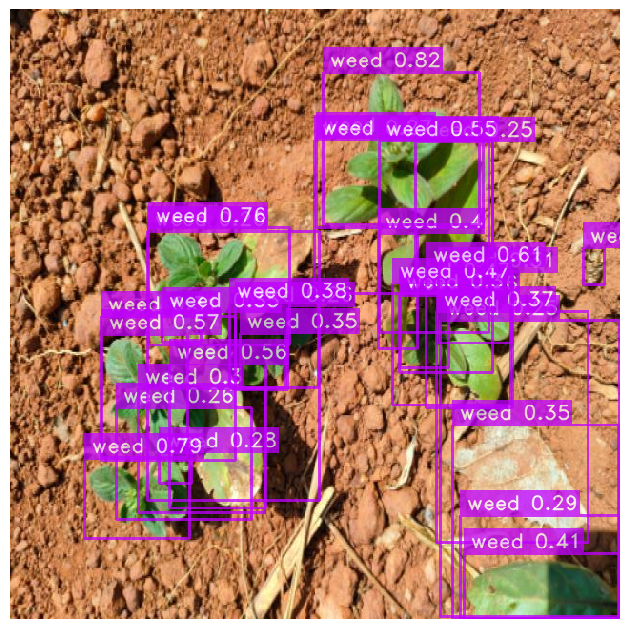

In [ ]:
best_model.predict( "/content/IMG20230217102743_jpg.rf.b769fb4d5b511357b0d1b030b6be6a9f.jpg",  conf=0.25).show()

In [ ]:
from super_gradients.training import models
from super_gradients.common.object_names import Models

model_v2 = models.get(Models.YOLO_NAS_M, pretrained_weights="coco")

[2024-02-08 11:17:12] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_m_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_m_coco.pth
100%|██████████| 196M/196M [00:02<00:00, 93.0MB/s]


In [ ]:

train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=1,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=1,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/train',
        'images_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/train/images',
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/train/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/valid',
        'images_dir':'/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/valid/images' ,
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/valid/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)


[2024-02-07 05:52:21] WARNING - yolo_format_detection.py - 240 label files are not associated to any image.
Caching annotations:  97%|█████████▋| 34/35 [00:35<00:01,  1.03s/it]

In [ ]:
trainer = Trainer(experiment_name='yolonas_medium', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
trainer.train(model=model_v2,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

The console stream is now moved to /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/console_Feb06_06_38_34.txt


[2024-02-06 06:38:34] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2024-02-06 06:38:39] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 300        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         18         (len(train_loader))
    - Gradient updates per epoch:   18         (len(train_loader) / batch_accumulate)

[2024-02-06 06:38:39] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 3/3 [00:02<00:00,  1.37it/s]
[2024-02-06 06:39:24] INFO - base_sg_logger.py - C

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.1402
│   ├── Ppyoloeloss/loss_iou = 0.3587
│   ├── Ppyoloeloss/loss_dfl = 1.8282
│   └── Ppyoloeloss/loss = 3.9512
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4608
    ├── Ppyoloeloss/loss_iou = 0.2323
    ├── Ppyoloeloss/loss_dfl = 1.4042
    ├── Ppyoloeloss/loss = 3.7435
    ├── Precision@0.50 = 0.2286
    ├── Recall@0.50 = 0.0368
    ├── Map@0.50 = 0.0523
    └── F1@0.50 = 0.0634



Validating epoch 1: 100%|██████████| 3/3 [00:02<00:00,  1.38it/s]
[2024-02-06 06:40:15] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:40:15] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.37425896525382996


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.2232
│   │   ├── Epoch N-1      = 2.1402 (↘ -0.9171)
│   │   └── Best until now = 2.1402 (↘ -0.9171)
│   ├── Ppyoloeloss/loss_iou = 0.2686
│   │   ├── Epoch N-1      = 0.3587 (↘ -0.0902)
│   │   └── Best until now = 0.3587 (↘ -0.0902)
│   ├── Ppyoloeloss/loss_dfl = 1.4049
│   │   ├── Epoch N-1      = 1.8282 (↘ -0.4233)
│   │   └── Best until now = 1.8282 (↘ -0.4233)
│   └── Ppyoloeloss/loss = 2.5971
│       ├── Epoch N-1      = 3.9512 (↘ -1.3541)
│       └── Best until now = 3.9512 (↘ -1.3541)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.6918
    │   ├── Epoch N-1      = 2.4608 (↗ 4.2311)
    │   └── Best until now = 2.4608 (↗ 4.2311)
    ├── Ppyoloeloss/loss_iou = 0.2197
    │   ├── Epoch N-1      = 0.2323 (↘ -0.0126)
    │   └── Best until now = 0.2323 (↘ -0.0126)
    ├── Ppyoloeloss/loss_dfl = 1.341
    │   ├── Epoch N-1      = 1.4042 (↘ -0.0632)
    │   └── Best until now = 1.4042 (↘ -0.0632)
    ├── Ppyoloeloss/loss 

Validating epoch 2: 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]
[2024-02-06 06:41:11] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:41:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5120498538017273


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9677
│   │   ├── Epoch N-1      = 1.2232 (↘ -0.2555)
│   │   └── Best until now = 1.2232 (↘ -0.2555)
│   ├── Ppyoloeloss/loss_iou = 0.23
│   │   ├── Epoch N-1      = 0.2686 (↘ -0.0385)
│   │   └── Best until now = 0.2686 (↘ -0.0385)
│   ├── Ppyoloeloss/loss_dfl = 1.25
│   │   ├── Epoch N-1      = 1.4049 (↘ -0.1549)
│   │   └── Best until now = 1.4049 (↘ -0.1549)
│   └── Ppyoloeloss/loss = 2.1678
│       ├── Epoch N-1      = 2.5971 (↘ -0.4293)
│       └── Best until now = 2.5971 (↘ -0.4293)
└── Validation
    ├── Ppyoloeloss/loss_cls = 3.0743
    │   ├── Epoch N-1      = 6.6918 (↘ -3.6176)
    │   └── Best until now = 2.4608 (↗ 0.6135)
    ├── Ppyoloeloss/loss_iou = 0.2157
    │   ├── Epoch N-1      = 0.2197 (↘ -0.004)
    │   └── Best until now = 0.2197 (↘ -0.004)
    ├── Ppyoloeloss/loss_dfl = 1.3915
    │   ├── Epoch N-1      = 1.341  (↗ 0.0505)
    │   └── Best until now = 1.341  (↗ 0.0505)
    ├── Ppyoloeloss/loss = 4.30

Validating epoch 3: 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]
[2024-02-06 06:42:17] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:42:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6340659260749817


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9607
│   │   ├── Epoch N-1      = 0.9677 (↘ -0.0069)
│   │   └── Best until now = 0.9677 (↘ -0.0069)
│   ├── Ppyoloeloss/loss_iou = 0.2223
│   │   ├── Epoch N-1      = 0.23   (↘ -0.0077)
│   │   └── Best until now = 0.23   (↘ -0.0077)
│   ├── Ppyoloeloss/loss_dfl = 1.245
│   │   ├── Epoch N-1      = 1.25   (↘ -0.005)
│   │   └── Best until now = 1.25   (↘ -0.005)
│   └── Ppyoloeloss/loss = 2.1391
│       ├── Epoch N-1      = 2.1678 (↘ -0.0287)
│       └── Best until now = 2.1678 (↘ -0.0287)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.411
    │   ├── Epoch N-1      = 3.0743 (↘ -0.6633)
    │   └── Best until now = 2.4608 (↘ -0.0498)
    ├── Ppyoloeloss/loss_iou = 0.2004
    │   ├── Epoch N-1      = 0.2157 (↘ -0.0152)
    │   └── Best until now = 0.2157 (↘ -0.0152)
    ├── Ppyoloeloss/loss_dfl = 1.3153
    │   ├── Epoch N-1      = 1.3915 (↘ -0.0763)
    │   └── Best until now = 1.341  (↘ -0.0257)
    ├── Ppyoloeloss/loss =

Validating epoch 4: 100%|██████████| 3/3 [00:02<00:00,  1.31it/s]
[2024-02-06 06:43:19] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:43:19] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6472498774528503


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9455
│   │   ├── Epoch N-1      = 0.9607 (↘ -0.0152)
│   │   └── Best until now = 0.9607 (↘ -0.0152)
│   ├── Ppyoloeloss/loss_iou = 0.2218
│   │   ├── Epoch N-1      = 0.2223 (↘ -0.0005)
│   │   └── Best until now = 0.2223 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_dfl = 1.2446
│   │   ├── Epoch N-1      = 1.245  (↘ -0.0004)
│   │   └── Best until now = 1.245  (↘ -0.0004)
│   └── Ppyoloeloss/loss = 2.1224
│       ├── Epoch N-1      = 2.1391 (↘ -0.0166)
│       └── Best until now = 2.1391 (↘ -0.0166)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8739
    │   ├── Epoch N-1      = 2.411  (↘ -0.5371)
    │   └── Best until now = 2.411  (↘ -0.5371)
    ├── Ppyoloeloss/loss_iou = 0.1991
    │   ├── Epoch N-1      = 0.2004 (↘ -0.0013)
    │   └── Best until now = 0.2004 (↘ -0.0013)
    ├── Ppyoloeloss/loss_dfl = 1.3664
    │   ├── Epoch N-1      = 1.3153 (↗ 0.0511)
    │   └── Best until now = 1.3153 (↗ 0.0511)
    ├── Ppyoloeloss/loss

Validating epoch 5: 100%|██████████| 3/3 [00:02<00:00,  1.31it/s]
[2024-02-06 06:44:25] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:44:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.739875853061676


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9195
│   │   ├── Epoch N-1      = 0.9455 (↘ -0.026)
│   │   └── Best until now = 0.9455 (↘ -0.026)
│   ├── Ppyoloeloss/loss_iou = 0.2212
│   │   ├── Epoch N-1      = 0.2218 (↘ -0.0006)
│   │   └── Best until now = 0.2218 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 1.1974
│   │   ├── Epoch N-1      = 1.2446 (↘ -0.0471)
│   │   └── Best until now = 1.2446 (↘ -0.0471)
│   └── Ppyoloeloss/loss = 2.0713
│       ├── Epoch N-1      = 2.1224 (↘ -0.0511)
│       └── Best until now = 2.1224 (↘ -0.0511)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.5915
    │   ├── Epoch N-1      = 1.8739 (↘ -0.2824)
    │   └── Best until now = 1.8739 (↘ -0.2824)
    ├── Ppyoloeloss/loss_iou = 0.1991
    │   ├── Epoch N-1      = 0.1991 (↘ -0.0)
    │   └── Best until now = 0.1991 (↘ -0.0)
    ├── Ppyoloeloss/loss_dfl = 1.3163
    │   ├── Epoch N-1      = 1.3664 (↘ -0.0502)
    │   └── Best until now = 1.3153 (↗ 0.001)
    ├── Ppyoloeloss/loss = 2.747

Validating epoch 6: 100%|██████████| 3/3 [00:02<00:00,  1.12it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9081
│   │   ├── Epoch N-1      = 0.9195 (↘ -0.0114)
│   │   └── Best until now = 0.9195 (↘ -0.0114)
│   ├── Ppyoloeloss/loss_iou = 0.2099
│   │   ├── Epoch N-1      = 0.2212 (↘ -0.0114)
│   │   └── Best until now = 0.2212 (↘ -0.0114)
│   ├── Ppyoloeloss/loss_dfl = 1.1629
│   │   ├── Epoch N-1      = 1.1974 (↘ -0.0345)
│   │   └── Best until now = 1.1974 (↘ -0.0345)
│   └── Ppyoloeloss/loss = 2.0143
│       ├── Epoch N-1      = 2.0713 (↘ -0.057)
│       └── Best until now = 2.0713 (↘ -0.057)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4898
    │   ├── Epoch N-1      = 1.5915 (↘ -0.1017)
    │   └── Best until now = 1.5915 (↘ -0.1017)
    ├── Ppyoloeloss/loss_iou = 0.1989
    │   ├── Epoch N-1      = 0.1991 (↘ -0.0002)
    │   └── Best until now = 0.1991 (↘ -0.0002)
    ├── Ppyoloeloss/loss_dfl = 1.2482
    │   ├── Epoch N-1      = 1.3163 (↘ -0.0681)
    │   └── Best until now = 1.3153 (↘ -0.0671)
    ├── Ppyoloeloss/loss

Validating epoch 7: 100%|██████████| 3/3 [00:02<00:00,  1.17it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8934
│   │   ├── Epoch N-1      = 0.9081 (↘ -0.0147)
│   │   └── Best until now = 0.9081 (↘ -0.0147)
│   ├── Ppyoloeloss/loss_iou = 0.2054
│   │   ├── Epoch N-1      = 0.2099 (↘ -0.0045)
│   │   └── Best until now = 0.2099 (↘ -0.0045)
│   ├── Ppyoloeloss/loss_dfl = 1.1497
│   │   ├── Epoch N-1      = 1.1629 (↘ -0.0133)
│   │   └── Best until now = 1.1629 (↘ -0.0133)
│   └── Ppyoloeloss/loss = 1.9818
│       ├── Epoch N-1      = 2.0143 (↘ -0.0326)
│       └── Best until now = 2.0143 (↘ -0.0326)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2162
    │   ├── Epoch N-1      = 1.4898 (↘ -0.2735)
    │   └── Best until now = 1.4898 (↘ -0.2735)
    ├── Ppyoloeloss/loss_iou = 0.1907
    │   ├── Epoch N-1      = 0.1989 (↘ -0.0082)
    │   └── Best until now = 0.1989 (↘ -0.0082)
    ├── Ppyoloeloss/loss_dfl = 1.2516
    │   ├── Epoch N-1      = 1.2482 (↗ 0.0034)
    │   └── Best until now = 1.2482 (↗ 0.0034)
    ├── Ppyoloeloss/loss

Validating epoch 8: 100%|██████████| 3/3 [00:02<00:00,  1.27it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.891
│   │   ├── Epoch N-1      = 0.8934 (↘ -0.0024)
│   │   └── Best until now = 0.8934 (↘ -0.0024)
│   ├── Ppyoloeloss/loss_iou = 0.2006
│   │   ├── Epoch N-1      = 0.2054 (↘ -0.0048)
│   │   └── Best until now = 0.2054 (↘ -0.0048)
│   ├── Ppyoloeloss/loss_dfl = 1.1436
│   │   ├── Epoch N-1      = 1.1497 (↘ -0.0061)
│   │   └── Best until now = 1.1497 (↘ -0.0061)
│   └── Ppyoloeloss/loss = 1.9644
│       ├── Epoch N-1      = 1.9818 (↘ -0.0174)
│       └── Best until now = 1.9818 (↘ -0.0174)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0342
    │   ├── Epoch N-1      = 1.2162 (↘ -0.182)
    │   └── Best until now = 1.2162 (↘ -0.182)
    ├── Ppyoloeloss/loss_iou = 0.183
    │   ├── Epoch N-1      = 0.1907 (↘ -0.0077)
    │   └── Best until now = 0.1907 (↘ -0.0077)
    ├── Ppyoloeloss/loss_dfl = 1.1879
    │   ├── Epoch N-1      = 1.2516 (↘ -0.0637)
    │   └── Best until now = 1.2482 (↘ -0.0603)
    ├── Ppyoloeloss/loss =

Validating epoch 9: 100%|██████████| 3/3 [00:02<00:00,  1.16it/s]
[2024-02-06 06:49:16] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth
[2024-02-06 06:49:16] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.743316650390625


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8702
│   │   ├── Epoch N-1      = 0.891  (↘ -0.0208)
│   │   └── Best until now = 0.891  (↘ -0.0208)
│   ├── Ppyoloeloss/loss_iou = 0.2001
│   │   ├── Epoch N-1      = 0.2006 (↘ -0.0005)
│   │   └── Best until now = 0.2006 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_dfl = 1.1091
│   │   ├── Epoch N-1      = 1.1436 (↘ -0.0345)
│   │   └── Best until now = 1.1436 (↘ -0.0345)
│   └── Ppyoloeloss/loss = 1.925
│       ├── Epoch N-1      = 1.9644 (↘ -0.0394)
│       └── Best until now = 1.9644 (↘ -0.0394)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0081
    │   ├── Epoch N-1      = 1.0342 (↘ -0.0262)
    │   └── Best until now = 1.0342 (↘ -0.0262)
    ├── Ppyoloeloss/loss_iou = 0.18
    │   ├── Epoch N-1      = 0.183  (↘ -0.003)
    │   └── Best until now = 0.183  (↘ -0.003)
    ├── Ppyoloeloss/loss_dfl = 1.1479
    │   ├── Epoch N-1      = 1.1879 (↘ -0.0399)
    │   └── Best until now = 1.1879 (↘ -0.0399)
    ├── Ppyoloeloss/loss = 

[2024-02-06 06:49:55] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 3/3 [00:03<00:00,  1.08s/it]


[2024-02-06 07:47:25] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth EMA checkpoint.
[2024-02-06 07:47:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


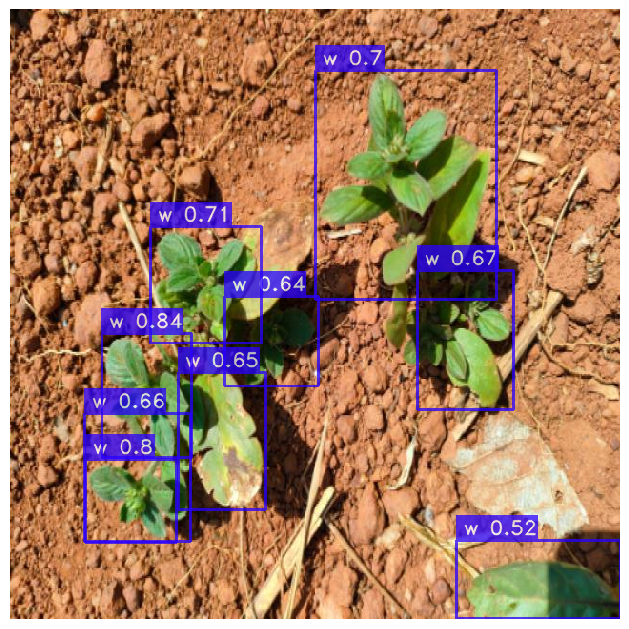

In [ ]:
#num_classes set to 80 here while loading, because of some unresolvable issues, however the end reuslt is not affected at all
model= models.get(Models.YOLO_NAS_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolonas_medium', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217102743_jpg.rf.b769fb4d5b511357b0d1b030b6be6a9f.jpg",  conf=0.5).show()


# NOTE:  ALWAYS SET conf value between 0.25 and 0.5. Do not go above 0.5. 0.5 gives the best results so far.

In [ ]:
# YOLO_X small

from super_gradients.training import models

model = models.get("yolox_s", pretrained_weights="coco", num_classes=1)

print('Num classes in the model:', model.num_classes)

Downloading: "https://sghub.deci.ai/models/yolox_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolox_s_coco.pth
100%|██████████| 34.5M/34.5M [00:00<00:00, 48.7MB/s]


In [ ]:
from super_gradients.training import training_hyperparams


train_params = training_hyperparams.get('coco2017_yolox')

train_params

In [ ]:
#modifying the trainable parameters for transfer learning

train_params['max_epochs'] = 10
train_params['lr_warmup_epochs'] = 2
train_params['lr_cooldown_epochs'] = 1
train_params['criterion_params']['num_classes'] = 1
train_params['average_best_models'] = True
train_params['initial_lr'] = 5e-4  #setting it very low initially so as to not disturb the model's weights too much
train_params['cosine_final_lr_ratio'] = 0.1
train_params['mixed_precision'] = False

In [ ]:
trainer = Trainer(experiment_name='yolo_x_small', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
trainer.train(model=model, training_params=train_params, train_loader=train_data, valid_loader=val_data)

[2024-02-06 11:51:16] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolo_x_small/ckpt_best.pth EMA checkpoint.
[2024-02-06 11:51:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


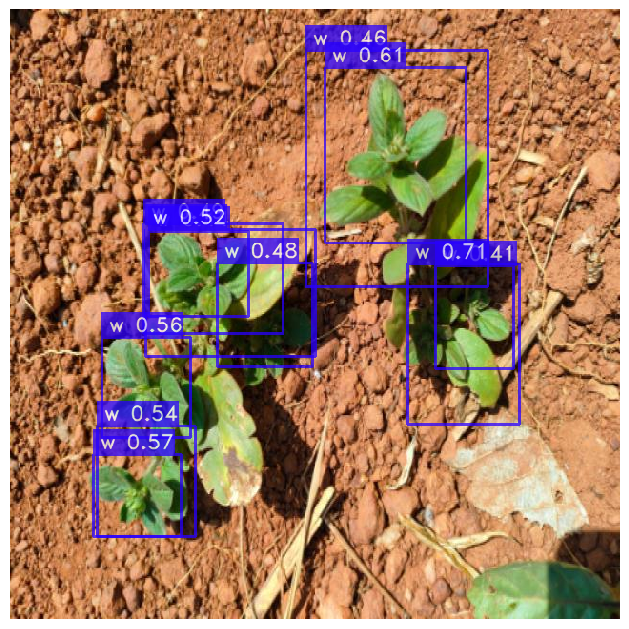

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.YOLOX_S,
                        num_classes=1,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolo_x_small', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217102743_jpg.rf.b769fb4d5b511357b0d1b030b6be6a9f.jpg",conf=0.4).show()

In [ ]:
# PPyoloe_M

from super_gradients.training import models

model = models.get("ppyoloe_m", pretrained_weights="coco")


In [ ]:
from super_gradients.training import training_hyperparams

train_params = training_hyperparams.get('coco2017_ppyoloe_m')

train_params

In [ ]:
train_params['max_epochs'] = 10
train_params['lr_warmup_epochs'] = 2
train_params['lr_cooldown_epochs'] = 1
train_params['num_classes']=1
train_params['initial_lr'] = 5e-4  #setting it very low initially so as to not disturb the model's weights too much


In [ ]:
trainer = Trainer(experiment_name='ppyoloe_m', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:

trainer.train(model=model, training_params=train_params, train_loader=train_data, valid_loader=val_data)

[2024-02-07 07:02:49] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m/ckpt_best.pth EMA checkpoint.
[2024-02-07 07:02:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


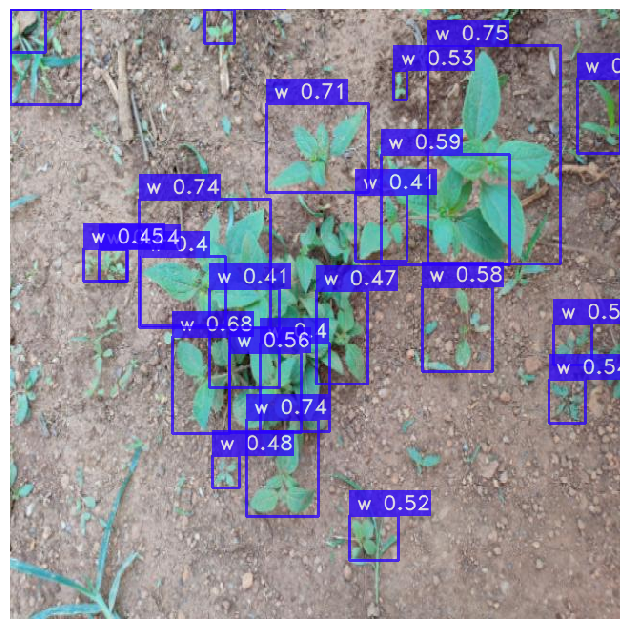

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217105428_jpg.rf.2686015b4a3280c6758194807f58a69d.jpg",conf=0.4).show()

In [ ]:
from super_gradients.training import training_hyperparams

train_params = training_hyperparams.get('coco2017_ppyoloe_m')



In [ ]:
train_params['max_epochs'] = 10
train_params['lr_warmup_epochs'] = 2
train_params['lr_cooldown_epochs'] = 1
train_params['num_classes']=1
train_params['initial_lr'] = 5e-4  #setting it very low initially so as to not disturb the model's weights too much
train_params['mixed_precision']=False

In [ ]:
trainer = Trainer(experiment_name='ppyoloe_m_transfer', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')


In [ ]:
train_data_new = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/train',
        'images_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/train/images',
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/train/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)

val_data_new = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/valid',
        'images_dir':'/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/valid/images' ,
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/ALW trail.v1i.yolov5pytorch/valid/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)


Caching annotations:  93%|█████████▎| 14/15 [00:18<00:01,  1.32s/it]

In [ ]:
# My new novel approach: Transfer learning on new (additional different weeds) dataset, on the previously trained model, to improve the model
#Instead of repetitive fine-tuning of all model parameters,which is overkill as it unnecessarily increases training time and tweaks the already-good model's backbone parameters,
# I manually freeze the backbone weights which serve as feature extractors and are sufficiently trained, and train the remaining parameters on the new and bigger dataset
# Hence, the model shows much improved performance across all metrics
# This is a better alternative to repetitive fine-tuning over the entire model, and makes the training speed and accuracy much better

model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m', 'ckpt_best.pth'))


trainable_parameters = sum([p.numel() for p in model.parameters() if p.requires_grad])

for m in model.backbone.parameters():
   m.requires_grad = False

trainable_parameters_after = sum([p.numel() for p in model.parameters() if p.requires_grad])


[2024-02-07 06:40:58] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m/ckpt_best.pth EMA checkpoint.


In [ ]:
print(trainable_parameters)
print(trainable_parameters_after)

24134892
14817468


In [ ]:
trainer.train(model=model, training_params=train_params, train_loader=train_data_new, valid_loader=val_data_new)

[2024-02-07 07:02:06] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m_transfer/ckpt_best.pth EMA checkpoint.
[2024-02-07 07:02:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


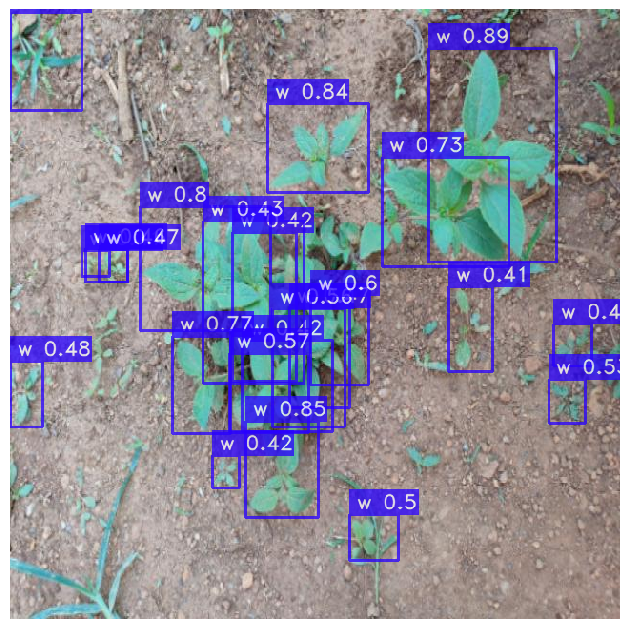

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m_transfer', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217105428_jpg.rf.2686015b4a3280c6758194807f58a69d.jpg",conf=0.4).show()

In [ ]:
# The following code is my own new idea/procedure , which I call : " Iterative fine-tuning after freezing backbone parameters"
# Where I essentially freeze the model, train it on yet another new dataset, and can potentially repeat this process again and again, across many different small and medium sized datasets
# This process improves model performance, and helps it generalize better over different data distributions and weed patterns.


train_data_new_2 = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/train',
        'images_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/train/images',
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/train/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)

val_data_new_2 = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/valid',
        'images_dir':'/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/valid/images' ,
        'labels_dir': '/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/Weed detection 2.0.v4i.yolov5pytorch/valid/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)




Caching annotations:  93%|█████████▎| 14/15 [00:07<00:00,  1.82it/s]

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m_transfer', 'ckpt_best.pth'))


trainable_parameters = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(model.parameters())

for m in model.backbone.parameters():
   m.requires_grad = False


trainable_parameters_after = sum([p.numel() for p in model.parameters() if p.requires_grad])

[2024-02-07 11:41:53] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m_transfer/ckpt_best.pth EMA checkpoint.


In [ ]:
for p in model.parameters():
  print(p)

In [ ]:
print(trainable_parameters)
print(trainable_parameters_after)

24134892
14817468


In [ ]:
from super_gradients.training import training_hyperparams

train_params = training_hyperparams.get('coco2017_ppyoloe_m')


In [ ]:
train_params['max_epochs'] = 10
train_params['lr_warmup_epochs'] = 2
train_params['lr_cooldown_epochs'] = 1
train_params['num_classes']=1
train_params['initial_lr'] = 5e-4  #setting it very low initially so as to not disturb the model's weights too much
train_params['mixed_precision']=False

In [ ]:
trainer = Trainer(experiment_name='ppyoloe_m_transfer_v2', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
trainer.train(model=model, training_params=train_params, train_loader=train_data_new_2,valid_loader=val_data_new_2)

[2024-02-07 09:08:04] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m_transfer_v2/ckpt_best.pth EMA checkpoint.
[2024-02-07 09:08:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


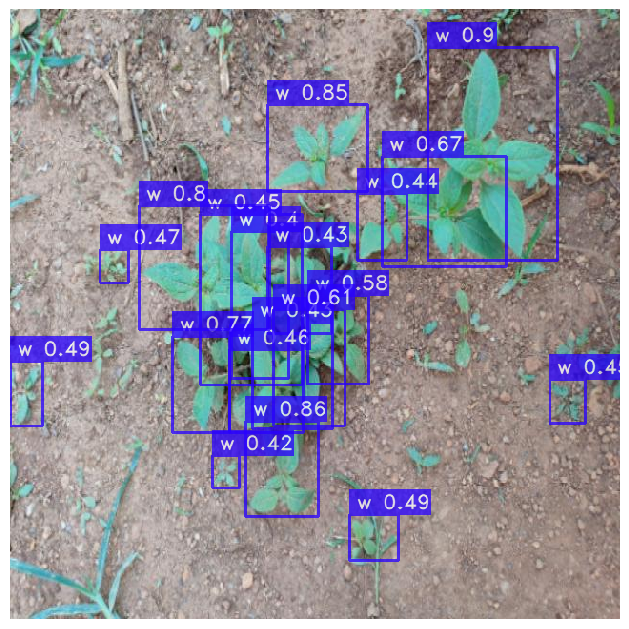

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m_transfer_v2', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217105428_jpg.rf.2686015b4a3280c6758194807f58a69d.jpg",conf=0.4).show()

In [ ]:
#Following code is for another procedure where I freeze the neck parameters as well

from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m_transfer', 'ckpt_best.pth'))


trainable_parameters = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(model.parameters())

for m in model.backbone.parameters():
   m.requires_grad = False

for n in model.neck.parameters():
  n.requires_grad=False

trainable_parameters_after = sum([p.numel() for p in model.parameters() if p.requires_grad])

[2024-02-07 11:49:17] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m_transfer/ckpt_best.pth EMA checkpoint.


In [ ]:
print(trainable_parameters)
print(trainable_parameters_after)

24134892
3090972


In [ ]:
from super_gradients.training import training_hyperparams

train_params = training_hyperparams.get('coco2017_ppyoloe_m')

In [ ]:
train_params['max_epochs'] = 10
train_params['lr_warmup_epochs'] = 2
train_params['lr_cooldown_epochs'] = 1
train_params['num_classes']=1
train_params['initial_lr'] = 5e-4  #setting it very low initially so as to not disturb the model's weights too much
train_params['mixed_precision']=False

In [ ]:
trainer = Trainer(experiment_name='ppyoloe_m_transfer_v3', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
trainer.train(model=model, training_params=train_params, train_loader=train_data_new_2,valid_loader=val_data_new_2)

[2024-02-07 12:02:38] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/ppyoloe_m_transfer_v2/ckpt_best.pth EMA checkpoint.
[2024-02-07 12:02:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


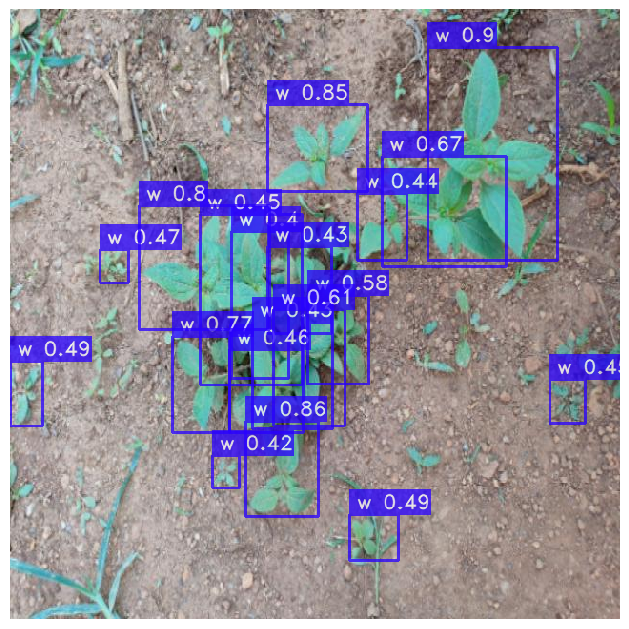

In [ ]:
from super_gradients.common.object_names import Models
model= models.get(Models.PP_YOLOE_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','ppyoloe_m_transfer_v2', 'ckpt_best.pth'))

model.predict( "/content/IMG20230217105428_jpg.rf.2686015b4a3280c6758194807f58a69d.jpg",conf=0.4).show()

In [ ]:
# transfer learning on the previously trained model( yolonas medium), which till now has shown the best score
from super_gradients.common.object_names import Models
model= models.get(Models.YOLO_NAS_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolonas_medium', 'ckpt_best.pth'))


[2024-02-08 10:49:11] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_medium/ckpt_best.pth EMA checkpoint.


In [ ]:

trainable_parameters = sum([p.numel() for p in model.parameters() if p.requires_grad])

print(model.parameters())

for m in model.backbone.parameters():
   m.requires_grad = False

for n in model.neck.parameters():
  n.requires_grad=False

trainable_parameters_after = sum([p.numel() for p in model.parameters() if p.requires_grad])

<generator object Module.parameters at 0x7e9ecd7dbf40>


In [ ]:
print(trainable_parameters)
print(trainable_parameters_after)

51182658
3781116


In [ ]:

train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 10,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=1,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=1,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

In [ ]:
trainer = Trainer(experiment_name='yolonas_m_transfer', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
trainer.train(model=model, training_params=train_params, train_loader=train_data_new,valid_loader=val_data_new)

In [5]:
from super_gradients.common.object_names import Models

In [ ]:

model= models.get(Models.YOLO_NAS_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolonas_m_transfer', 'ckpt_best.pth'))


In [ ]:
# Next iterations of transfer learning on yolonas medium ( used various other datasets of different weed structures and image types)
model_2= models.get(Models.YOLO_NAS_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolonas_m_transfer', 'ckpt_best.pth'))


In [ ]:

trainable_parameters = sum([p.numel() for p in model_2.parameters() if p.requires_grad])

print(model_2.parameters())

for m in model_2.backbone.parameters():
   m.requires_grad = False

for n in model_2.neck.parameters():
  n.requires_grad=False

trainable_parameters_after = sum([p.numel() for p in model_2.parameters() if p.requires_grad])

<generator object Module.parameters at 0x7ba7312d6b90>


In [ ]:
train_data_new_3 = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/train',
        'images_dir': '/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/train/images',
        'labels_dir': '/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/train/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)

val_data_new_3 = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': '/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/valid',
        'images_dir':'/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/valid/images' ,
        'labels_dir': '/content/drive/MyDrive/Ridderzuring 416x416 2-step.v1i.yolov5pytorch/valid/labels',
        'classes': 'weeds'
    },
    dataloader_params={
    'batch_size':16,
    'num_workers':2
    }
)


Caching annotations:  98%|█████████▊| 51/52 [01:04<00:01,  1.22s/it]

In [ ]:
trainer = Trainer(experiment_name='yolonas_m_transfer_v3', ckpt_root_dir='/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train')

In [ ]:
#Overall model's mAP score has dropped, when this new dataset was introduced, however the model still performs very impressively across different weed images with confusing backgrounds and shapes
trainer.train(model=model_2, training_params=train_params, train_loader=train_data_new_3,valid_loader=val_data_new_3)

The console stream is now moved to /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_m_transfer_v3/console_Feb09_07_53_30.txt


[2024-02-09 07:53:31] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
[2024-02-09 07:53:39] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Dataset size:                 491        (len(train_set))
    - Batch size per GPU:           16         (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             16         (num_gpus * batch_size)
    - Effective Batch size:         16         (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         30         (len(train_loader))
    - Gradient updates per epoch:   30         (len(train_loader) / batch_accumulate)

[2024-02-09 07:53:39] INFO - sg_trainer.py - Started training for 10 epochs (0/9)

Validating: 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]
[2024-02-09 07:54:33] INFO - base_sg_logger.py - C

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.084
│   ├── Ppyoloeloss/loss_iou = 0.2459
│   ├── Ppyoloeloss/loss_dfl = 1.312
│   └── Ppyoloeloss/loss = 2.3547
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.405
    ├── Ppyoloeloss/loss_iou = 0.2164
    ├── Ppyoloeloss/loss_dfl = 1.3421
    ├── Ppyoloeloss/loss = 2.6171
    ├── Precision@0.50 = 0.0133
    ├── Recall@0.50 = 0.9822
    ├── Map@0.50 = 0.5462
    └── F1@0.50 = 0.0263



Validating epoch 1: 100%|██████████| 4/4 [00:03<00:00,  1.27it/s]
[2024-02-09 07:55:47] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_m_transfer_v3/ckpt_best.pth
[2024-02-09 07:55:47] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5670920014381409


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0838
│   │   ├── Epoch N-1      = 1.084  (↘ -0.0002)
│   │   └── Best until now = 1.084  (↘ -0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.2471
│   │   ├── Epoch N-1      = 0.2459 (↗ 0.0013)
│   │   └── Best until now = 0.2459 (↗ 0.0013)
│   ├── Ppyoloeloss/loss_dfl = 1.3092
│   │   ├── Epoch N-1      = 1.312  (↘ -0.0028)
│   │   └── Best until now = 1.312  (↘ -0.0028)
│   └── Ppyoloeloss/loss = 2.3563
│       ├── Epoch N-1      = 2.3547 (↗ 0.0016)
│       └── Best until now = 2.3547 (↗ 0.0016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3173
    │   ├── Epoch N-1      = 1.405  (↘ -0.0877)
    │   └── Best until now = 1.405  (↘ -0.0877)
    ├── Ppyoloeloss/loss_iou = 0.2187
    │   ├── Epoch N-1      = 0.2164 (↗ 0.0022)
    │   └── Best until now = 0.2164 (↗ 0.0022)
    ├── Ppyoloeloss/loss_dfl = 1.3222
    │   ├── Epoch N-1      = 1.3421 (↘ -0.0198)
    │   └── Best until now = 1.3421 (↘ -0.0198)
    ├── Ppyoloeloss/loss = 2

Validating epoch 2: 100%|██████████| 4/4 [00:03<00:00,  1.21it/s]


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0847
│   │   ├── Epoch N-1      = 1.0838 (↗ 0.0009)
│   │   └── Best until now = 1.0838 (↗ 0.0009)
│   ├── Ppyoloeloss/loss_iou = 0.2448
│   │   ├── Epoch N-1      = 0.2471 (↘ -0.0024)
│   │   └── Best until now = 0.2459 (↘ -0.0011)
│   ├── Ppyoloeloss/loss_dfl = 1.3061
│   │   ├── Epoch N-1      = 1.3092 (↘ -0.0031)
│   │   └── Best until now = 1.3092 (↘ -0.0031)
│   └── Ppyoloeloss/loss = 2.3497
│       ├── Epoch N-1      = 2.3563 (↘ -0.0066)
│       └── Best until now = 2.3547 (↘ -0.005)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2527
    │   ├── Epoch N-1      = 1.3173 (↘ -0.0646)
    │   └── Best until now = 1.3173 (↘ -0.0646)
    ├── Ppyoloeloss/loss_iou = 0.2188
    │   ├── Epoch N-1      = 0.2187 (↗ 1e-04)
    │   └── Best until now = 0.2164 (↗ 0.0023)
    ├── Ppyoloeloss/loss_dfl = 1.3206
    │   ├── Epoch N-1      = 1.3222 (↘ -0.0016)
    │   └── Best until now = 1.3222 (↘ -0.0016)
    ├── Ppyoloeloss/loss = 2

Validating epoch 3: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0904
│   │   ├── Epoch N-1      = 1.0847 (↗ 0.0057)
│   │   └── Best until now = 1.0838 (↗ 0.0065)
│   ├── Ppyoloeloss/loss_iou = 0.2464
│   │   ├── Epoch N-1      = 0.2448 (↗ 0.0016)
│   │   └── Best until now = 0.2448 (↗ 0.0016)
│   ├── Ppyoloeloss/loss_dfl = 1.3131
│   │   ├── Epoch N-1      = 1.3061 (↗ 0.0069)
│   │   └── Best until now = 1.3061 (↗ 0.0069)
│   └── Ppyoloeloss/loss = 2.3629
│       ├── Epoch N-1      = 2.3497 (↗ 0.0132)
│       └── Best until now = 2.3497 (↗ 0.0132)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4814
    │   ├── Epoch N-1      = 1.2527 (↗ 0.2287)
    │   └── Best until now = 1.2527 (↗ 0.2287)
    ├── Ppyoloeloss/loss_iou = 0.2151
    │   ├── Epoch N-1      = 0.2188 (↘ -0.0036)
    │   └── Best until now = 0.2164 (↘ -0.0013)
    ├── Ppyoloeloss/loss_dfl = 1.3383
    │   ├── Epoch N-1      = 1.3206 (↗ 0.0177)
    │   └── Best until now = 1.3206 (↗ 0.0177)
    ├── Ppyoloeloss/loss = 2.6883


Validating epoch 4: 100%|██████████| 4/4 [00:04<00:00,  1.10s/it]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0842
│   │   ├── Epoch N-1      = 1.0904 (↘ -0.0061)
│   │   └── Best until now = 1.0838 (↗ 0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.2428
│   │   ├── Epoch N-1      = 0.2464 (↘ -0.0036)
│   │   └── Best until now = 0.2448 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 1.3009
│   │   ├── Epoch N-1      = 1.3131 (↘ -0.0122)
│   │   └── Best until now = 1.3061 (↘ -0.0053)
│   └── Ppyoloeloss/loss = 2.3417
│       ├── Epoch N-1      = 2.3629 (↘ -0.0212)
│       └── Best until now = 2.3497 (↘ -0.008)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3683
    │   ├── Epoch N-1      = 1.4814 (↘ -0.1131)
    │   └── Best until now = 1.2527 (↗ 0.1156)
    ├── Ppyoloeloss/loss_iou = 0.2198
    │   ├── Epoch N-1      = 0.2151 (↗ 0.0047)
    │   └── Best until now = 0.2151 (↗ 0.0047)
    ├── Ppyoloeloss/loss_dfl = 1.3605
    │   ├── Epoch N-1      = 1.3383 (↗ 0.0222)
    │   └── Best until now = 1.3206 (↗ 0.0399)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 5: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]
[2024-02-09 08:00:31] INFO - base_sg_logger.py - Checkpoint saved in /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_m_transfer_v3/ckpt_best.pth
[2024-02-09 08:00:31] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5836560726165771


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0607
│   │   ├── Epoch N-1      = 1.0842 (↘ -0.0235)
│   │   └── Best until now = 1.0838 (↘ -0.0231)
│   ├── Ppyoloeloss/loss_iou = 0.2437
│   │   ├── Epoch N-1      = 0.2428 (↗ 0.0009)
│   │   └── Best until now = 0.2428 (↗ 0.0009)
│   ├── Ppyoloeloss/loss_dfl = 1.2996
│   │   ├── Epoch N-1      = 1.3009 (↘ -0.0013)
│   │   └── Best until now = 1.3009 (↘ -0.0013)
│   └── Ppyoloeloss/loss = 2.3199
│       ├── Epoch N-1      = 2.3417 (↘ -0.0218)
│       └── Best until now = 2.3417 (↘ -0.0218)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2364
    │   ├── Epoch N-1      = 1.3683 (↘ -0.1318)
    │   └── Best until now = 1.2527 (↘ -0.0162)
    ├── Ppyoloeloss/loss_iou = 0.2213
    │   ├── Epoch N-1      = 0.2198 (↗ 0.0014)
    │   └── Best until now = 0.2151 (↗ 0.0061)
    ├── Ppyoloeloss/loss_dfl = 1.3517
    │   ├── Epoch N-1      = 1.3605 (↘ -0.0088)
    │   └── Best until now = 1.3206 (↗ 0.0311)
    ├── Ppyoloeloss/loss = 

Validating epoch 6: 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0789
│   │   ├── Epoch N-1      = 1.0607 (↗ 0.0182)
│   │   └── Best until now = 1.0607 (↗ 0.0182)
│   ├── Ppyoloeloss/loss_iou = 0.2446
│   │   ├── Epoch N-1      = 0.2437 (↗ 0.0009)
│   │   └── Best until now = 0.2428 (↗ 0.0018)
│   ├── Ppyoloeloss/loss_dfl = 1.313
│   │   ├── Epoch N-1      = 1.2996 (↗ 0.0134)
│   │   └── Best until now = 1.2996 (↗ 0.0134)
│   └── Ppyoloeloss/loss = 2.3469
│       ├── Epoch N-1      = 2.3199 (↗ 0.027)
│       └── Best until now = 2.3199 (↗ 0.027)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.2398
    │   ├── Epoch N-1      = 1.2364 (↗ 0.0034)
    │   └── Best until now = 1.2364 (↗ 0.0034)
    ├── Ppyoloeloss/loss_iou = 0.2186
    │   ├── Epoch N-1      = 0.2213 (↘ -0.0026)
    │   └── Best until now = 0.2151 (↗ 0.0035)
    ├── Ppyoloeloss/loss_dfl = 1.3466
    │   ├── Epoch N-1      = 1.3517 (↘ -0.0051)
    │   └── Best until now = 1.3206 (↗ 0.026)
    ├── Ppyoloeloss/loss = 2.4597
    

Validating epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0834
│   │   ├── Epoch N-1      = 1.0789 (↗ 0.0045)
│   │   └── Best until now = 1.0607 (↗ 0.0226)
│   ├── Ppyoloeloss/loss_iou = 0.241
│   │   ├── Epoch N-1      = 0.2446 (↘ -0.0036)
│   │   └── Best until now = 0.2428 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_dfl = 1.3004
│   │   ├── Epoch N-1      = 1.313  (↘ -0.0126)
│   │   └── Best until now = 1.2996 (↗ 0.0008)
│   └── Ppyoloeloss/loss = 2.3361
│       ├── Epoch N-1      = 2.3469 (↘ -0.0108)
│       └── Best until now = 2.3199 (↗ 0.0163)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3568
    │   ├── Epoch N-1      = 1.2398 (↗ 0.1169)
    │   └── Best until now = 1.2364 (↗ 0.1203)
    ├── Ppyoloeloss/loss_iou = 0.218
    │   ├── Epoch N-1      = 0.2186 (↘ -0.0006)
    │   └── Best until now = 0.2151 (↗ 0.0029)
    ├── Ppyoloeloss/loss_dfl = 1.3563
    │   ├── Epoch N-1      = 1.3466 (↗ 0.0097)
    │   └── Best until now = 1.3206 (↗ 0.0357)
    ├── Ppyoloeloss/loss = 2.58
 

Validating epoch 8: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0824
│   │   ├── Epoch N-1      = 1.0834 (↘ -0.001)
│   │   └── Best until now = 1.0607 (↗ 0.0217)
│   ├── Ppyoloeloss/loss_iou = 0.2473
│   │   ├── Epoch N-1      = 0.241  (↗ 0.0063)
│   │   └── Best until now = 0.241  (↗ 0.0063)
│   ├── Ppyoloeloss/loss_dfl = 1.3204
│   │   ├── Epoch N-1      = 1.3004 (↗ 0.02)
│   │   └── Best until now = 1.2996 (↗ 0.0208)
│   └── Ppyoloeloss/loss = 2.361
│       ├── Epoch N-1      = 2.3361 (↗ 0.0248)
│       └── Best until now = 2.3199 (↗ 0.0411)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.3556
    │   ├── Epoch N-1      = 1.3568 (↘ -0.0011)
    │   └── Best until now = 1.2364 (↗ 0.1192)
    ├── Ppyoloeloss/loss_iou = 0.2163
    │   ├── Epoch N-1      = 0.218  (↘ -0.0017)
    │   └── Best until now = 0.2151 (↗ 0.0012)
    ├── Ppyoloeloss/loss_dfl = 1.3352
    │   ├── Epoch N-1      = 1.3563 (↘ -0.0211)
    │   └── Best until now = 1.3206 (↗ 0.0145)
    ├── Ppyoloeloss/loss = 2.5639
  

Validating epoch 9: 100%|██████████| 4/4 [00:04<00:00,  1.05s/it]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.067
│   │   ├── Epoch N-1      = 1.0824 (↘ -0.0154)
│   │   └── Best until now = 1.0607 (↗ 0.0063)
│   ├── Ppyoloeloss/loss_iou = 0.2444
│   │   ├── Epoch N-1      = 0.2473 (↘ -0.003)
│   │   └── Best until now = 0.241  (↗ 0.0033)
│   ├── Ppyoloeloss/loss_dfl = 1.2976
│   │   ├── Epoch N-1      = 1.3204 (↘ -0.0228)
│   │   └── Best until now = 1.2996 (↘ -0.002)
│   └── Ppyoloeloss/loss = 2.3267
│       ├── Epoch N-1      = 2.361  (↘ -0.0343)
│       └── Best until now = 2.3199 (↗ 0.0068)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4937
    │   ├── Epoch N-1      = 1.3556 (↗ 0.1381)
    │   └── Best until now = 1.2364 (↗ 0.2573)
    ├── Ppyoloeloss/loss_iou = 0.2154
    │   ├── Epoch N-1      = 0.2163 (↘ -0.0009)
    │   └── Best until now = 0.2151 (↗ 0.0003)
    ├── Ppyoloeloss/loss_dfl = 1.3354
    │   ├── Epoch N-1      = 1.3352 (↗ 0.0002)
    │   └── Best until now = 1.3206 (↗ 0.0148)
    ├── Ppyoloeloss/loss = 2.6999

[2024-02-09 08:06:27] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 10: 100%|██████████| 4/4 [00:04<00:00,  1.00s/it]


[2024-02-09 08:17:09] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train/yolonas_m_transfer_v3/ckpt_best.pth EMA checkpoint.
[2024-02-09 08:17:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


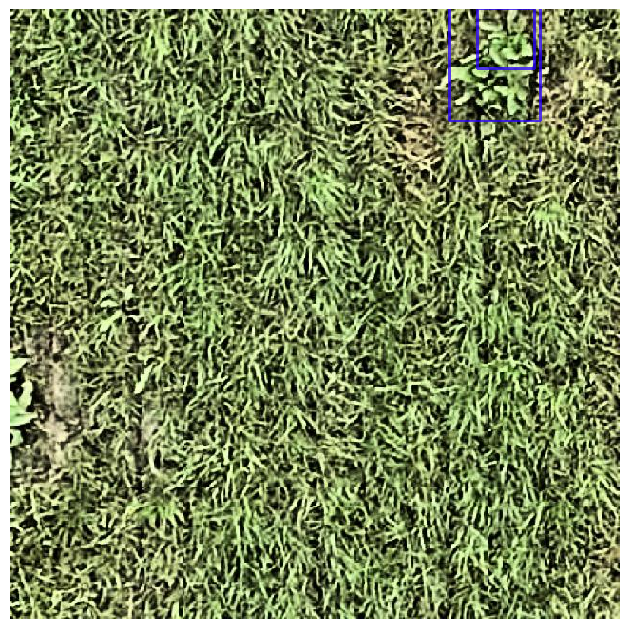

In [10]:
#this image is from another dataset, which the model is not trained on, and is very hard difficulty-level wise.
# model detects it correctly for boxes with confidence score near 0.6
#model performs incorrectly for scores less than 0.5

model= models.get(Models.YOLO_NAS_M,
                        num_classes=80,
                        checkpoint_path=os.path.join('/content/drive/MyDrive/Weed detection.v4i.yolov5pytorch/yolov5/runs/train','yolonas_m_transfer_v3', 'ckpt_best.pth'))

model.predict( "/content/ridderzuring_3861_jpg.rf.602153cec69d012ab5c065f9005ad346.jpg",  conf=0.6).show()

[2024-02-09 08:17:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


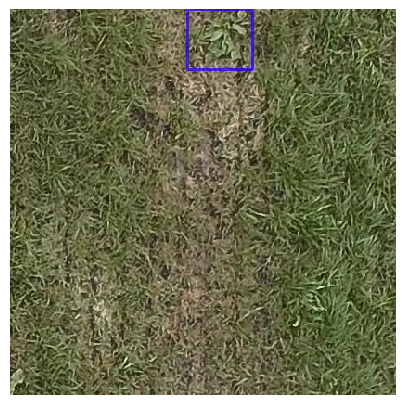

In [11]:
model.predict( "/content/ridderzuring_0075_jpg.rf.a41bae7f247e0664f43ae3d4b5f0c4b3.jpg",  conf=0.5).show()

[2024-02-09 08:20:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


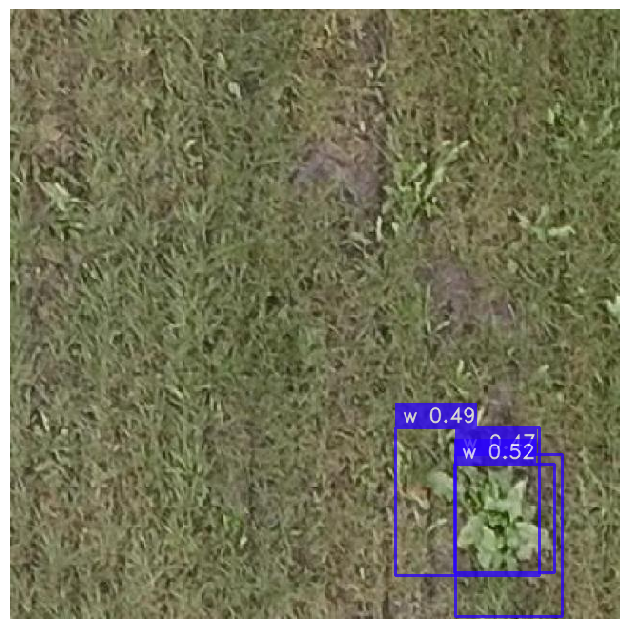

In [13]:
model.predict( "/content/thumb.jpg",  conf=0.4).show()

[2024-02-09 08:25:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


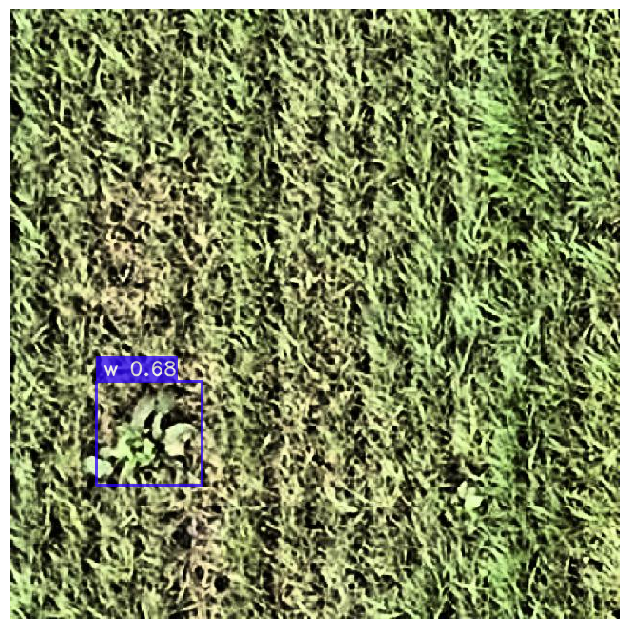

In [18]:
#another example of an extremely hard image, the type on which model was NOT trained.
#Model works impressively, but only when confidence scores are kept above 0.5

model.predict( "/content/ridderzuring_4834_jpg.rf.16ab238491df4ec3790ccdbb2ef85367.jpg",  conf=0.55).show()